# Final Project (Continuation of Mid-Term Project)

Rishabh Kaushick <br> 
NU ID: 002808996, <br>
kaushick.r@northeastern.edu <br>
<br>
College of Engineering, <br>
Northeastern University <br>
Toronto, ON

In [9]:
# importing the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [10]:
# loading the data
# structured data
scm_dataset_path = 'data/DataCoSupplyChainDataset.csv'
scm_df = pd.read_csv(scm_dataset_path, encoding='latin-1')

# unstructured data
scm_unstructured_path = 'data/tokenized_access_logs.csv'
scm_unstructured_df = pd.read_csv(scm_unstructured_path)

In [11]:
# Let's see what the first five rows data looks like
scm_df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [12]:
# total number of rows in the above csv:
scm_df.count()

Type                             180519
Days for shipping (real)         180519
Days for shipment (scheduled)    180519
Benefit per order                180519
Sales per customer               180519
Delivery Status                  180519
Late_delivery_risk               180519
Category Id                      180519
Category Name                    180519
Customer City                    180519
Customer Country                 180519
Customer Email                   180519
Customer Fname                   180519
Customer Id                      180519
Customer Lname                   180511
Customer Password                180519
Customer Segment                 180519
Customer State                   180519
Customer Street                  180519
Customer Zipcode                 180516
Department Id                    180519
Department Name                  180519
Latitude                         180519
Longitude                        180519
Market                           180519


In [13]:
scm_unstructured_df.head()

,Product,Category,Date,Month,Hour,Department,ip,url
0,adidas Brazuca 2017 Official Match Ball,baseball & softball,9/1/2017 6:00,Sep,6,fitness,37.97.182.65,/department/fitness/category/baseball%20&%20so...
1,The North Face Women's Recon Backpack,hunting & shooting,9/1/2017 6:00,Sep,6,fan shop,206.56.112.1,/department/fan%20shop/category/hunting%20&%20...
2,adidas Kids' RG III Mid Football Cleat,featured shops,9/1/2017 6:00,Sep,6,apparel,215.143.180.0,/department/apparel/category/featured%20shops/...
3,Under Armour Men's Compression EV SL Slide,electronics,9/1/2017 6:00,Sep,6,footwear,206.56.112.1,/department/footwear/category/electronics/prod...
4,Pelican Sunstream 100 Kayak,water sports,9/1/2017 6:01,Sep,6,fan shop,136.108.56.242,/department/fan%20shop/category/water%20sports...


In [14]:
scm_unstructured_df.count()

Product       469977
Category      469977
Date          469977
Month         469977
Hour          469977
Department    469977
ip            469977
url           469977
dtype: int64

In the main csv dataset, there are 53 columns and 180,519 rows. Therefore there are 53 X 180,519 = 9,567,507 data points.
<br><br>
However, from the unstructured dataset, we can see that there are 8 columns and 469,977 rows. Therefore there are 8 X 469,977 = 3,759,816 data points <br> <br>
Since the columns in each of the datasets are different from each other, and since there is a lot more data in the structured dataframe, we will use the same and disregard the unstructured data for the scope of this project.

In [15]:
# understanding the number of distinct non null numbers are present in each column
scm_df.nunique()

Type                                  4
Days for shipping (real)              7
Days for shipment (scheduled)         4
Benefit per order                 21998
Sales per customer                 2927
Delivery Status                       4
Late_delivery_risk                    2
Category Id                          51
Category Name                        50
Customer City                       563
Customer Country                      2
Customer Email                        1
Customer Fname                      782
Customer Id                       20652
Customer Lname                     1109
Customer Password                     1
Customer Segment                      3
Customer State                       46
Customer Street                    7458
Customer Zipcode                    995
Department Id                        11
Department Name                      11
Latitude                          11250
Longitude                          4487
Market                                5


In [16]:
# checking which columns have null rows
scm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

From the above -  we can see that there are null values in the following columns
- Order Zipcode
- Project Description


In [17]:
scm_df.describe()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,...,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180516.000000,180519.000000,180519.000000,...,180519.000000,180519.000000,180519.000000,180519.000000,24840.000000,180519.000000,180519.000000,0.0,180519.000000,180519.0
mean,3.497654,2.931847,21.974989,183.107609,0.548291,31.851451,6691.379495,35921.126914,5.443460,29.719955,...,2.127638,203.772096,183.107609,21.974989,55426.132327,692.509764,31.851451,NaN,141.232550,0.0
std,1.623722,1.374449,104.433526,120.043670,0.497664,15.640064,4162.918106,37542.461122,1.629246,9.813646,...,1.453451,132.273077,120.043670,104.433526,31919.279101,336.446807,15.640064,NaN,139.732492,0.0
min,0.000000,0.000000,-4274.979980,7.490000,0.000000,2.000000,1.000000,603.000000,2.000000,-33.937553,...,1.000000,9.990000,7.490000,-4274.979980,1040.000000,19.000000,2.000000,NaN,9.990000,0.0
25%,2.000000,2.000000,7.000000,104.379997,0.000000,18.000000,3258.500000,725.000000,4.000000,18.265432,...,1.000000,119.980003,104.379997,7.000000,23464.000000,403.000000,18.000000,NaN,50.000000,0.0
50%,3.000000,4.000000,31.520000,163.990005,1.000000,29.000000,6457.000000,19380.000000,5.000000,33.144863,...,1.000000,199.919998,163.990005,31.520000,59405.000000,627.000000,29.000000,NaN,59.990002,0.0
75%,5.000000,4.000000,64.800003,247.399994,1.000000,45.000000,9779.000000,78207.000000,7.000000,39.279617,...,3.000000,299.950012,247.399994,64.800003,90008.000000,1004.000000,45.000000,NaN,199.990005,0.0
max,6.000000,4.000000,911.799988,1939.989990,1.000000,76.000000,20757.000000,99205.000000,12.000000,48.781933,...,5.000000,1999.989990,1939.989990,911.799988,99301.000000,1363.000000,76.000000,NaN,1999.989990,0.0


In [18]:
# Let's see what kind of data is present in the 'Type' Column
scm_df['Type'].value_counts()

Type
DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x178b78250>,
 [Text(0.428168266257398, 1.1210137982068438, 'DEBIT'),
  Text(-1.1885215498911712, -0.16557936297826523, 'TRANSFER'),
  Text(0.19342361628901053, -1.1843087877161436, 'PAYMENT'),
  Text(1.130752535999951, -0.40174457349126647, 'CASH')])

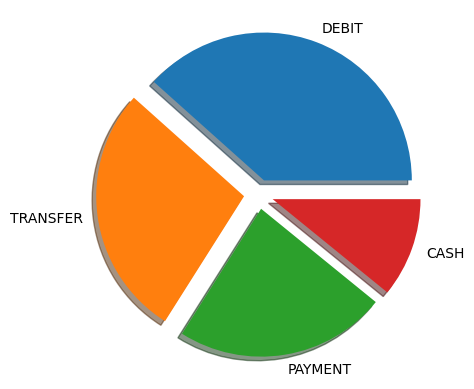

In [19]:
# visualizing the same thing in a pie chart

# Trying to create a plot with each section exploded from the pie.
my_explode = [0.1, 0.1, 0.1, 0.1]
my_labels = np.array(['DEBIT', 'TRANSFER', 'PAYMENT', 'CASH'])
type_value_array = (scm_df['Type'].value_counts())
plt.pie(type_value_array, labels=my_labels, shadow=True, explode=my_explode)

In [20]:
# Delivery Status
scm_df['Delivery Status'].value_counts()

Delivery Status
Late delivery        98977
Advance shipping     41592
Shipping on time     32196
Shipping canceled     7754
Name: count, dtype: int64

Text(0.5, 1.0, 'Frequency Distribution of Delivery Status')

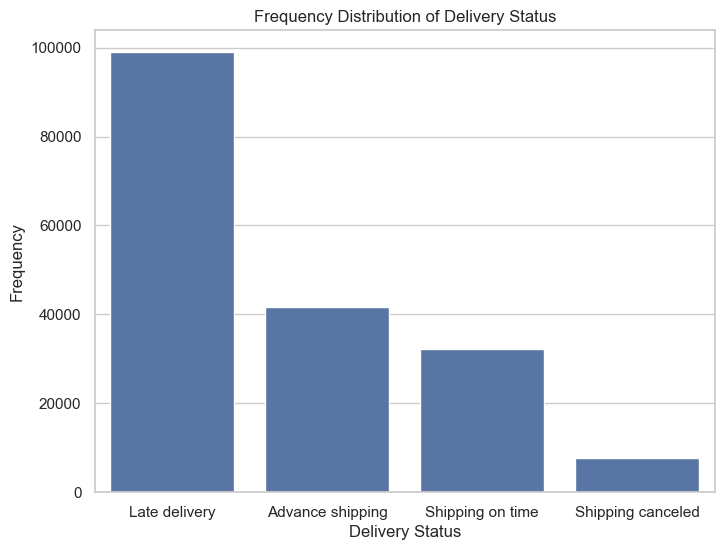

In [21]:
# plotting it in a graph to visualize it better
sns.set(style="whitegrid")
plt.figure(figsize = (8,6))
sns.barplot(scm_df['Delivery Status'].value_counts())
plt.xlabel("Delivery Status")
plt.ylabel("Frequency")
plt.title("Frequency Distribution of Delivery Status")

We can see that the Delivery Status for most of the deliveries in the dataset are 'Late delivery'

<Axes: xlabel='Late Delivery Risk', ylabel='Frequency'>

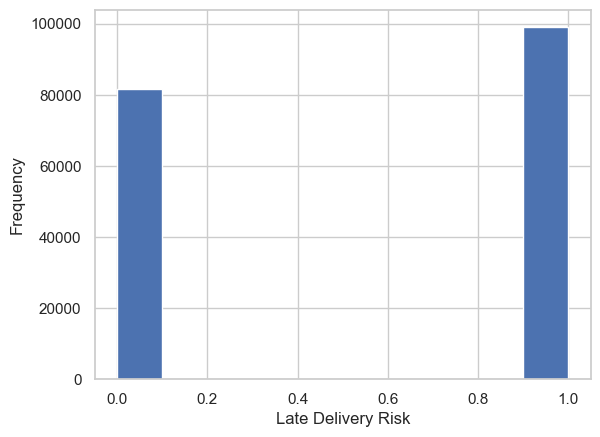

In [22]:
# late delivery risk column
# scm_df['Late_delivery_risk'].value_counts()
scm_df['Late_delivery_risk'].plot.hist(xlabel='Late Delivery Risk')

<Axes: xlabel='Delivery Status', ylabel='count'>

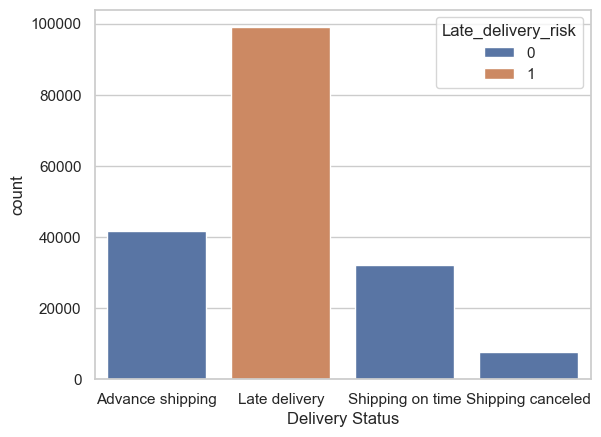

In [23]:
# late delivery risk and delivery status
sns.countplot(scm_df, x='Delivery Status', hue='Late_delivery_risk')

The above graph is counter-intuitive. Only on Late deliveries - we have 'Late delivery risk' as 1, and on all other Delivery statuses, the late delivery risk is 0.


Therefore, while training the model we can remove the Delivery Status column - since it is a redundant version of the 'Late delivery risk' column.

In [24]:
# checking which columns have null rows
scm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

Let us try to find out more about location data of the customers which result in late delivery.

<Axes: xlabel='Order Region', ylabel='count'>

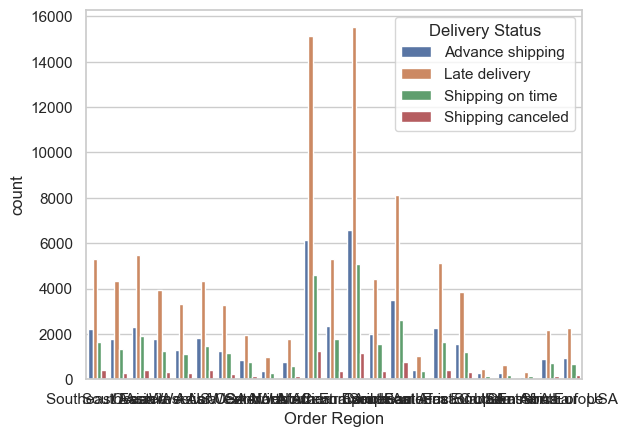

In [25]:
# Plotting geographic data of the customer locations which resulted in Late Delivery
sns.countplot(scm_df, x='Order Region', hue='Delivery Status')


The above plot is not useful since we are unable to see the regions on the x-axis

However, we can plot the same data but instead of order region in the x axis & different colors for delivery status, let us consider delivery status on the x-axis and regions with different colors

<Axes: xlabel='Delivery Status', ylabel='count'>

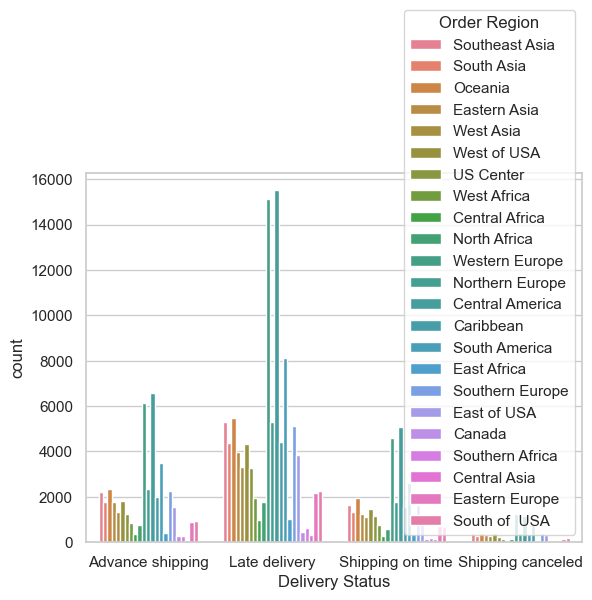

In [26]:
# trying to plot the same figure in a different way
sns.countplot(scm_df, x='Delivery Status', hue='Order Region')

This is better, but it is still hard to read the graph to understand exactly which region has most delivery statuses as 'Late delievry'

Therefore, using the plotly library as shown below in order to have an interactive graph to plot the same data.

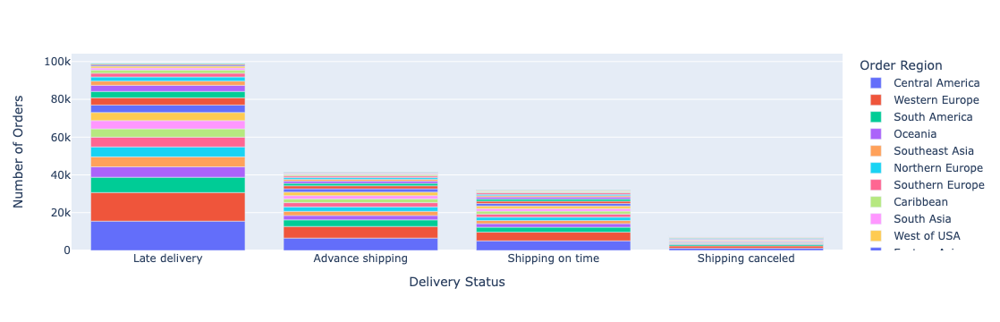

In [27]:
# displaying the same data using plotly library
data_delivery_status_region=scm_df.groupby(['Delivery Status', 'Order Region'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(data_delivery_status_region, x='Delivery Status', y='Number of Orders'  , color='Order Region',
       )

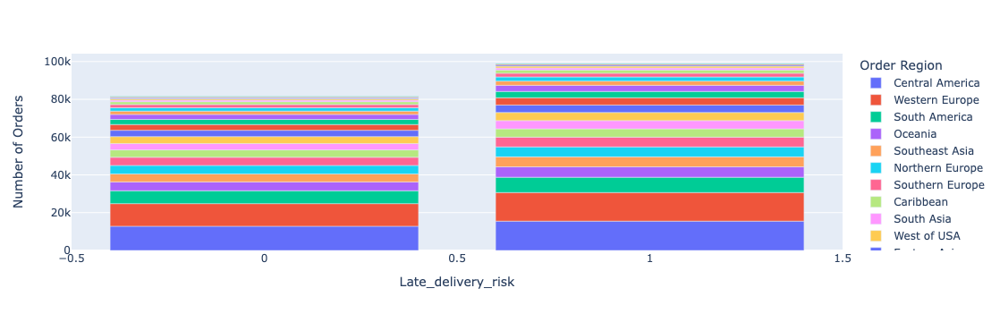

In [28]:
# late delivery risk vs order region
data_delivery_status_region=scm_df.groupby(['Late_delivery_risk', 'Order Region'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(data_delivery_status_region, x='Late_delivery_risk', y='Number of Orders'  , color='Order Region',
       )

In [29]:
# Customer Segment
scm_df['Customer Segment'].value_counts()

Customer Segment
Consumer       93504
Corporate      54789
Home Office    32226
Name: count, dtype: int64

In [30]:
# Market
scm_df['Market'].value_counts()

Market
LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: count, dtype: int64

<Axes: xlabel='Market', ylabel='percent'>

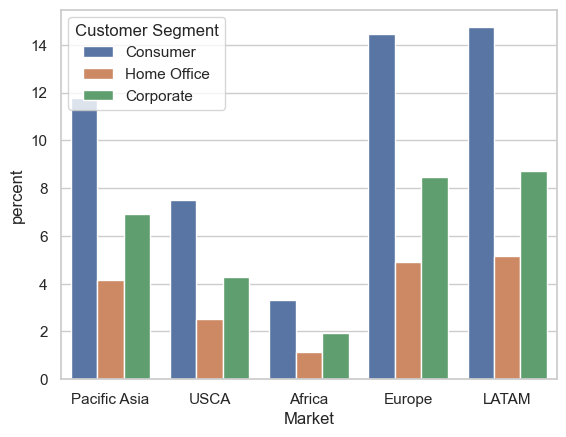

In [31]:
# In each market - finding the customer segment (Consumer, Home Office and Corporate frequencies)
sns.countplot(scm_df, x="Market", hue="Customer Segment", stat="percent", legend="auto")

In [32]:
# Order Status
scm_df['Order Status'].value_counts()

Order Status
COMPLETE           59491
PENDING_PAYMENT    39832
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: count, dtype: int64

<Axes: title={'center': 'ORDER STATUS'}>

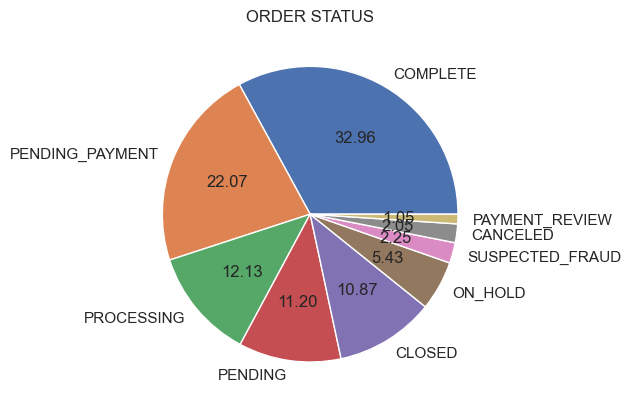

In [33]:
# again visualizing the order status with pie charts
scm_df['Order Status'].value_counts().plot.pie(title='ORDER STATUS',autopct="%.2f",ylabel="")

In [34]:
# Product Status
scm_df['Product Status'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 180519 entries, 0 to 180518
Series name: Product Status
Non-Null Count   Dtype
--------------   -----
180519 non-null  int64
dtypes: int64(1)
memory usage: 1.4 MB


In [35]:
scm_df['Product Status'].value_counts()

Product Status
0    180519
Name: count, dtype: int64

Product Status can be 1 - not available and 0 available.
In this dataset, we can see that all the values are 0 (available).

Therefore this data is not useful to us, and we can drop this column.

In [36]:
# Shipping Mode
scm_df['Shipping Mode'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 180519 entries, 0 to 180518
Series name: Shipping Mode
Non-Null Count   Dtype 
--------------   ----- 
180519 non-null  object
dtypes: object(1)
memory usage: 1.4+ MB


In [37]:
scm_df['Shipping Mode'].describe()

count             180519
unique                 4
top       Standard Class
freq              107752
Name: Shipping Mode, dtype: object

In [38]:
scm_df['Shipping Mode'].value_counts()

Shipping Mode
Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: count, dtype: int64

array([[<Axes: title={'center': 'Days for shipping (real)'}>,
        <Axes: title={'center': 'Days for shipment (scheduled)'}>,
        <Axes: title={'center': 'Benefit per order'}>,
        <Axes: title={'center': 'Sales per customer'}>],
       [<Axes: title={'center': 'Late_delivery_risk'}>,
        <Axes: title={'center': 'Customer Zipcode'}>,
        <Axes: title={'center': 'Latitude'}>,
        <Axes: title={'center': 'Longitude'}>],
       [<Axes: title={'center': 'Order Item Discount'}>,
        <Axes: title={'center': 'Order Item Discount Rate'}>,
        <Axes: title={'center': 'Order Item Product Price'}>,
        <Axes: title={'center': 'Order Item Profit Ratio'}>],
       [<Axes: title={'center': 'Order Item Quantity'}>,
        <Axes: title={'center': 'Sales'}>,
        <Axes: title={'center': 'Order Item Total'}>,
        <Axes: title={'center': 'Order Profit Per Order'}>],
       [<Axes: title={'center': 'Order Zipcode'}>,
        <Axes: title={'center': 'Product Price

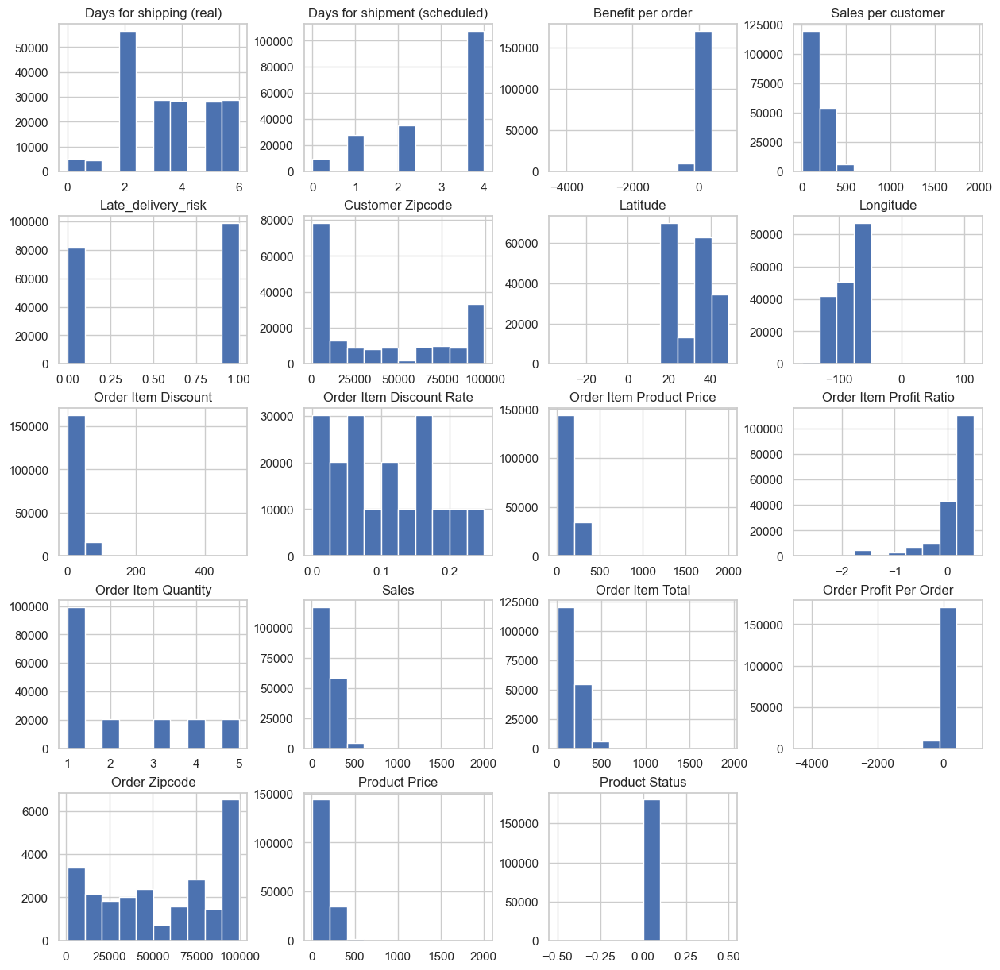

In [39]:
# plotting a histogram of all the columns

# creating a temporary dataframe for visualizing only those columns which have significance
scm_df_temp_visualization = scm_df.drop(columns=['Category Id', 
                                                 'Customer Id', 
                                                 'Department Id', 
                                                 'Order Customer Id',
                                                 'Order Id',
                                                 'Order Item Cardprod Id',
                                                 'Order Item Id',
                                                 'Product Card Id',
                                                 'Product Category Id',
                                                 'Product Description'])
scm_df_temp_visualization.hist(figsize=(15,15))

In [40]:
print(*scm_df['Category Name'].unique(), sep='\n')

Sporting Goods
Cleats
Shop By Sport
Women's Apparel
Electronics
Boxing & MMA
Cardio Equipment
Trade-In
Kids' Golf Clubs
Hunting & Shooting
Baseball & Softball
Men's Footwear
Camping & Hiking
Consumer Electronics
Cameras 
Computers
Basketball
Soccer
Girls' Apparel
Accessories
Women's Clothing
Crafts
Men's Clothing
Tennis & Racquet
Fitness Accessories
As Seen on  TV!
Golf Balls
Strength Training
Children's Clothing
Lacrosse
Baby 
Fishing
Books 
DVDs
CDs 
Garden
Hockey
Pet Supplies
Health and Beauty
Music
Video Games
Golf Gloves
Golf Bags & Carts
Golf Shoes
Golf Apparel
Women's Golf Clubs
Men's Golf Clubs
Toys
Water Sports
Indoor/Outdoor Games


/var/folders/3m/tt_kbz7d2tx3f5cx3v4nd4940000gn/T/ipykernel_76908/2825161110.py:13: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



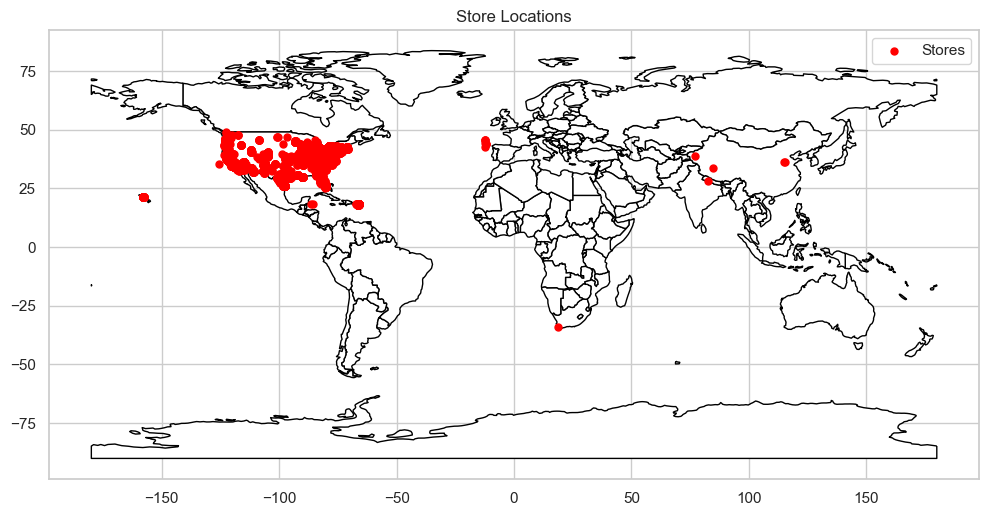

In [41]:
# using the latitude & longitude values from store to plot it on the world map
import geopandas as gpd

# dropping the duplicates and null rows
df_stores_location_lat_n_long = scm_df[['Latitude', 'Longitude']].drop_duplicates().dropna()

df_geo = gpd.GeoDataFrame(
    df_stores_location_lat_n_long,
    geometry=gpd.points_from_xy(df_stores_location_lat_n_long['Longitude'], df_stores_location_lat_n_long['Latitude'])
)

#get the map image
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

#plot the world map
ax = world.plot(figsize=(12, 8), color='white', edgecolor='black')

#plot the store locations as dots
df_geo.plot(ax=ax, marker='o', color='red', markersize=25, label='Stores')

plt.title('Store Locations')
plt.legend(loc='upper right')

## Model Preparation
Let us start with removing the following columns
1. ID Columns:
    - 'Category Id', 
    - 'Customer Id', 
    - 'Department Id', 
    - 'Order Customer Id',
    - 'Order Id',
    - 'Order Item Cardprod Id',
    - 'Order Item Id',
    - 'Product Card Id',
    - 'Product Category Id',
2. Irrelevant Non-numeric Columns
    - 'Product Description'
    - 'Customer Email'
    - 'Customer Password'
    - 'Customer Fname'
    - 'Customer Lname'
    - 'Customer State'
    - 'Customer Street'
    - 'Customer Zipcode'
    - Order Region
    - Order State
    - Order Status
    - Order Zipcode
    - Product Image
3. Redundant Columns:
    - 'Delivery Status'
    - 'Product Status'
    - 'Customer City'
    - 'Customer Country' (since we already have Order City and Order Country)

In [42]:
from sklearn import svm, metrics, tree, preprocessing, linear_model

In [43]:
scm_clean_df = scm_df.drop(columns=['Category Id', 
                                    'Customer Id', 
                                    'Department Id', 
                                    'Order Customer Id',
                                    'Order Id',
                                    'Order Item Cardprod Id',
                                    'Order Item Id',
                                    'Product Card Id',
                                    'Product Category Id',
                                    'Product Description',
                                    'Delivery Status',
                                    'Customer Email',
                                    'Customer Password',
                                    'Product Status',
                                    'Customer Fname',
                                    'Customer Lname',
                                    'Customer State',
                                    'Customer Street',
                                    'Customer Zipcode',
                                    'Customer City',
                                    'Customer Country',
                                    'Order Region',
                                    'Order State',
                                    'Order Status',
                                    'Order Zipcode',
                                    'Product Image'])

### Text Columns with Categorical Data
    - Type
    - Category Name
    - Customer Segment
    - Department Name
    - Market
    - Order City
    - Order Country
    - order date (DateOrders)
    - Product Name
    - shipping date (DateOrders)
    - Shipping Mode

In [44]:
# need to use LabelEncoders to convert the categorical text values
label_encoder = preprocessing.LabelEncoder()

In [45]:
scm_clean_df['Type'] = label_encoder.fit_transform(scm_clean_df['Type'])
scm_clean_df['Category Name'] = label_encoder.fit_transform(scm_clean_df['Category Name'])
scm_clean_df['Customer Segment'] = label_encoder.fit_transform(scm_clean_df['Customer Segment'])
scm_clean_df['Department Name'] = label_encoder.fit_transform(scm_clean_df['Department Name'])
scm_clean_df['Market'] = label_encoder.fit_transform(scm_clean_df['Market'])
scm_clean_df['Order City'] = label_encoder.fit_transform(scm_clean_df['Order City'])
scm_clean_df['Order Country'] = label_encoder.fit_transform(scm_clean_df['Order Country'])
scm_clean_df['order date (DateOrders)'] = label_encoder.fit_transform(scm_clean_df['order date (DateOrders)'])
scm_clean_df['Product Name'] = label_encoder.fit_transform(scm_clean_df['Product Name'])
scm_clean_df['shipping date (DateOrders)'] = label_encoder.fit_transform(scm_clean_df['shipping date (DateOrders)'])
scm_clean_df['Shipping Mode'] = label_encoder.fit_transform(scm_clean_df['Shipping Mode'])

In [46]:
scm_clean_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 27 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  int64  
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Late_delivery_risk             180519 non-null  int64  
 6   Category Name                  180519 non-null  int64  
 7   Customer Segment               180519 non-null  int64  
 8   Department Name                180519 non-null  int64  
 9   Latitude                       180519 non-null  float64
 10  Longitude                      180519 non-null  float64
 11  Market                         180519 non-null  int64  
 12  Order City                    

Now all the values are in either int or float.

## Splitting Train & Test Data

In [47]:
# Next creating the train and test set

# creating a function which splits the data randomly
def split_train_test(data, test_ratio):
    np.random.seed(23) # setting the random number generator's seed will make sure that each time the same test and train set will be considered.
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [48]:
# here we are splitting the data into 80% training and 20% testing sets.
scm_trainset, scm_testset = split_train_test(scm_clean_df, 0.2)

In [49]:
len(scm_trainset)

144416

In [50]:
len(scm_testset)

36103

# Decision Tree Model #1

In [51]:
from sklearn.tree import DecisionTreeClassifier
y = scm_trainset["Late_delivery_risk"]
X = scm_trainset.drop(columns="Late_delivery_risk")

tree_clf = DecisionTreeClassifier(max_depth=5, max_features="sqrt", random_state=23, splitter="random")
tree_clf.fit(X, y)

DecisionTreeClassifier(max_depth=5, max_features='sqrt', random_state=23,
                       splitter='random')

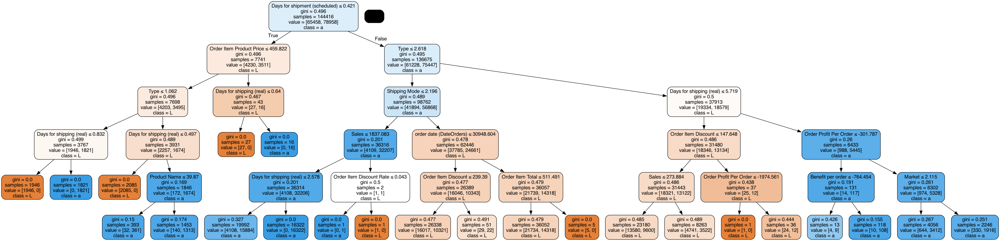

In [52]:
from sklearn.tree import export_graphviz
import pydotplus
# from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image

dot_data = StringIO()
export_graphviz(
        tree_clf,
        out_file=dot_data,
        feature_names= X.columns.values.tolist(),
        class_names= "Late_delivery_risk",
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree_model_1.png')
Image(graph.create_png())



In [53]:
# The decision tree model has been trained. We can now test it using the same train-set data.

predictions = tree_clf.predict(X)
predictions

array([0, 0, 0, ..., 0, 0, 0])

In [54]:
# Using mean sequared error to calculate the error percentage
from sklearn.metrics import mean_squared_error
tree_mean_sq_error = mean_squared_error(y, predictions)
tree_root_mean_sq_err = np.sqrt(tree_mean_sq_error)
tree_root_mean_sq_err

0.5460651806110116

Looks like the model is not able to predict the values well.
The % of error is 54.6%, which means the train accuracy is 46.4%.

# Decision Tree Model #2

In [55]:
# Training the a second model on different parameters

tree_clf = DecisionTreeClassifier(max_depth=10, max_features="log2", random_state=5, splitter="random", criterion="gini")
tree_clf.fit(X, y)

DecisionTreeClassifier(max_depth=10, max_features='log2', random_state=5,
                       splitter='random')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.658726 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.658726 to fit



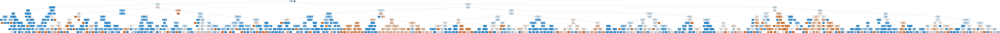

In [56]:
from sklearn.tree import export_graphviz
import pydotplus
# from sklearn.externals.six import StringIO  
from six import StringIO
from IPython.display import Image

dot_data = StringIO()
export_graphviz(
        tree_clf,
        out_file=dot_data,
        feature_names= X.columns.values.tolist(),
        class_names= "Late_delivery_risk",
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree_model_2.png')
Image(graph.create_png())



In [57]:
predictions = tree_clf.predict(X)
predictions

array([0, 0, 0, ..., 0, 1, 0])

In [58]:
tree_mean_sq_error = mean_squared_error(y, predictions)
tree_root_mean_sq_err = np.sqrt(tree_mean_sq_error)
tree_root_mean_sq_err

0.48176791227108456

This has helped us improve the model from 46% to 52%.

In [59]:
y_test = scm_testset['Late_delivery_risk']
X_test = scm_testset.drop(columns=['Late_delivery_risk'])
test_predictions = tree_clf.predict(X_test)
test_predictions

array([1, 1, 0, ..., 0, 1, 0])

In [60]:
tree_mean_sq_error = mean_squared_error(y_test, test_predictions)
tree_root_mean_sq_err = np.sqrt(tree_mean_sq_error)
tree_root_mean_sq_err

0.48137915965998845

We can see both train and test accuracy is around 52%.

------------------------------------------------------------------
<br>

## Mid Term Project finishes here.

## Final Project begins here.
<br> 

-----------------------------------------------------------------

## Revisiting The Data

There are some columns which can benefit from One Hot Encoding rather than Label Encoding: These columns are as follows:

In [61]:
scm_updated = scm_df

In [62]:
# just like above, let us remove the columns which are not needed
scm_updated.drop(columns=['Category Id', 
                                'Customer Id', 
                                'Department Id', 
                                'Order Customer Id',
                                'Order Id',
                                'Order Item Cardprod Id',
                                'Order Item Id',
                                'Product Card Id',
                                'Product Category Id',
                                'Product Description',
                                'Delivery Status',
                                'Customer Email',
                                'Customer Password',
                                'Product Status',
                                'Customer Fname',
                                'Customer Lname',
                                'Order Status',
                                'Product Image'],
                            inplace=True)

In [63]:
scm_updated['Type'].value_counts()

Type
DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: count, dtype: int64

In [64]:
scm_updated['Customer Segment'].value_counts()

Customer Segment
Consumer       93504
Corporate      54789
Home Office    32226
Name: count, dtype: int64

In [65]:
scm_updated['Department Name'].value_counts()

Department Name
Fan Shop              66861
Apparel               48998
Golf                  33220
Footwear              14525
Outdoors               9686
Fitness                2479
Discs Shop             2026
Technology             1465
Pet Shop                492
Book Shop               405
Health and Beauty       362
Name: count, dtype: int64

In [66]:
scm_updated['Market'].value_counts()

Market
LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: count, dtype: int64

In [67]:
scm_updated['Product Name'].value_counts()

Product Name
Perfect Fitness Perfect Rip Deck                 24515
Nike Men's CJ Elite 2 TD Football Cleat          22246
Nike Men's Dri-FIT Victory Golf Polo             21035
O'Brien Men's Neoprene Life Vest                 19298
Field & Stream Sportsman 16 Gun Fire Safe        17325
                                                 ...  
Stiga Master Series ST3100 Competition Indoor       27
SOLE E35 Elliptical                                 15
Bushnell Pro X7 Jolt Slope Rangefinder              11
Bowflex SelectTech 1090 Dumbbells                   10
SOLE E25 Elliptical                                 10
Name: count, Length: 118, dtype: int64

In [68]:
scm_updated['Shipping Mode'].value_counts()

Shipping Mode
Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: count, dtype: int64

## One Hot Encoding
We can use One Hot Encoding for the following columns:
1.	Type
2.	Delivery Status
3.	Customer Segment
4.	Market
5.	Shipping Mode

In [69]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

label_encoder_type = LabelEncoder()
one_hot_encoder = OneHotEncoder(sparse=False)

In [70]:
# First performing encoding on 'Type' column
# before converting to One Hot Encoding, we are using Label Encoding
type_integer_encoded = label_encoder_type.fit_transform(scm_updated['Type'])
# initially the shape of type_integer_encoded is (180519,)
# therefore, we need to reshape it to (180519,1)
type_integer_encoded = type_integer_encoded.reshape(len(type_integer_encoded), 1)
type_integer_encoded

array([[1],
       [3],
       [0],
       ...,
       [3],
       [2],
       [2]])

In [71]:
# Let us see these categories of the Label Encoding
label_encoder_type.classes_

array(['CASH', 'DEBIT', 'PAYMENT', 'TRANSFER'], dtype=object)

From the above we can see that the label encoding has converted the text to numbers in the following way: <br>
0: CASH <br>
1: DEBIT <br>
2: PAYMENT <br>
3: TRANSFER <br>

In [72]:
# Now converting the Label Encoded values into One Hot Encoding
type_one_hot = one_hot_encoder.fit_transform(type_integer_encoded)
print(type_one_hot)
print() # printing new line char
print(type_one_hot.shape)

[[0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 ...
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]]

(180519, 4)


Each of the columns represent the respective Label Encoder. Therefore: 
- Column 0 represents CASH
- Column 1 represents DEBIT
- Column 2 represents PAYMENT
- Column 3 represents TRANSFER

## Issue with One Hot Encoding: Multi-Collinearity
Many times when doing One Hot Encoding, the issue of Dummy Variable trap comes to the picture - which further leads to the problem of multi-collinearity. <br><br>
For the 'Type' column above (and others), we will check for multi-collinearity using the Variance Inflation Factor (VIF) score.

In [73]:
# importing a library for VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [74]:
# defining a function which calculates VIF for all the columns
def calculate_vif(X):
    vif = pd.DataFrame()
    vif["Columns"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return(vif)

In [75]:
# first converting the one hot encoded value to pandas df object
calculate_vif(pd.DataFrame(type_one_hot))

,Columns,VIF
0,0,1.0
1,1,1.0
2,2,1.0
3,3,1.0


We can see that all the four columns have VIF Value = 1. This means that all these columns can be added to the pandas data frame.

In [76]:
scm_updated[['Cash Type', 'Debit Type', 'Payment Type', 'Transfer Type']] = type_one_hot

In [77]:
# Verifying that the column names in the one hot encoding is correct
scm_updated.head(10)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,...,Order State,Order Zipcode,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Cash Type,Debit Type,Payment Type,Transfer Type
0,DEBIT,3,4,91.250000,314.640015,0,Sporting Goods,Caguas,Puerto Rico,Consumer,...,Java Occidental,NaN,Smart watch,327.75,2/3/2018 22:56,Standard Class,0.0,1.0,0.0,0.0
1,TRANSFER,5,4,-249.089996,311.359985,1,Sporting Goods,Caguas,Puerto Rico,Consumer,...,Rajastán,NaN,Smart watch,327.75,1/18/2018 12:27,Standard Class,0.0,0.0,0.0,1.0
2,CASH,4,4,-247.779999,309.720001,0,Sporting Goods,San Jose,EE. UU.,Consumer,...,Rajastán,NaN,Smart watch,327.75,1/17/2018 12:06,Standard Class,1.0,0.0,0.0,0.0
3,DEBIT,3,4,22.860001,304.809998,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,...,Queensland,NaN,Smart watch,327.75,1/16/2018 11:45,Standard Class,0.0,1.0,0.0,0.0
4,PAYMENT,2,4,134.210007,298.250000,0,Sporting Goods,Caguas,Puerto Rico,Corporate,...,Queensland,NaN,Smart watch,327.75,1/15/2018 11:24,Standard Class,0.0,0.0,1.0,0.0
5,TRANSFER,6,4,18.580000,294.980011,0,Sporting Goods,Tonawanda,EE. UU.,Consumer,...,Queensland,NaN,Smart watch,327.75,1/19/2018 11:03,Standard Class,0.0,0.0,0.0,1.0
6,DEBIT,2,1,95.180000,288.420013,1,Sporting Goods,Caguas,Puerto Rico,Home Office,...,Guangdong,NaN,Smart watch,327.75,1/15/2018 10:42,First Class,0.0,1.0,0.0,0.0
7,TRANSFER,2,1,68.430000,285.140015,1,Sporting Goods,Miami,EE. UU.,Corporate,...,Guangdong,NaN,Smart watch,327.75,1/15/2018 10:21,First Class,0.0,0.0,0.0,1.0
8,CASH,3,2,133.720001,278.589996,1,Sporting Goods,Caguas,Puerto Rico,Corporate,...,Guangdong,NaN,Smart watch,327.75,1/16/2018 10:00,Second Class,1.0,0.0,0.0,0.0
9,CASH,2,1,132.149994,275.309998,1,Sporting Goods,San Ramon,EE. UU.,Corporate,...,Guangdong,NaN,Smart watch,327.75,1/15/2018 9:39,First Class,1.0,0.0,0.0,0.0


In [78]:
# And finally, we can now drop the Type column.
scm_updated = scm_updated.drop(columns=['Type'])

Similar to the above process, we will do the One Hot Encoding for the other columns as well.

In [79]:
label_encoder_cust_seg = LabelEncoder()
label_encoder_market = LabelEncoder()
label_encoder_ship_mode = LabelEncoder()

In [80]:
# label encoder & one hot encoder for - customer segment
cust_seg_integer_encoded = label_encoder_cust_seg.fit_transform(scm_updated['Customer Segment'])
cust_seg_integer_encoded = cust_seg_integer_encoded.reshape(len(cust_seg_integer_encoded), 1)
cust_seg_one_hot = one_hot_encoder.fit_transform(cust_seg_integer_encoded)

# label encoder & one hot encoder for - market
market_integer_encoded = label_encoder_market.fit_transform(scm_updated['Market'])
market_integer_encoded = market_integer_encoded.reshape(len(market_integer_encoded), 1)
market_one_hot = one_hot_encoder.fit_transform(market_integer_encoded)

# label encoder & one hot encoder for - shipping mode
ship_mode_integer_encoded = label_encoder_ship_mode.fit_transform(scm_updated['Shipping Mode'])
ship_mode_integer_encoded = ship_mode_integer_encoded.reshape(len(ship_mode_integer_encoded), 1)
ship_mode_one_hot = one_hot_encoder.fit_transform(ship_mode_integer_encoded)

In [81]:
# now checking the vif for each of the above

print('VIF for Customer Segment')
print(calculate_vif(pd.DataFrame(cust_seg_one_hot)))

print('VIF for Market')
print(calculate_vif(pd.DataFrame(market_one_hot)))

print('VIF for Shipping Mode')
print(calculate_vif(pd.DataFrame(ship_mode_one_hot)))

VIF for Customer Segment
   Columns  VIF
0        0  1.0
1        1  1.0
2        2  1.0
VIF for Market
   Columns  VIF
0        0  1.0
1        1  1.0
2        2  1.0
3        3  1.0
4        4  1.0
VIF for Shipping Mode
   Columns  VIF
0        0  1.0
1        1  1.0
2        2  1.0
3        3  1.0


Surprisingly the VIF values for all the other columns are also 1.0.
Therefore, we can add them all into the pandas data frame.

In [82]:
# Customer Segment Encoding
print(label_encoder_cust_seg.classes_)

['Consumer' 'Corporate' 'Home Office']


In [83]:
scm_updated[['Consumer Customer Segment', 'Corporate Customer Segment', 'Home Office Customer Segment']] = cust_seg_one_hot

In [84]:
scm_updated[['Customer Segment', 'Consumer Customer Segment', 'Corporate Customer Segment', 'Home Office Customer Segment']].head(10)

,Customer Segment,Consumer Customer Segment,Corporate Customer Segment,Home Office Customer Segment
0,Consumer,1.0,0.0,0.0
1,Consumer,1.0,0.0,0.0
2,Consumer,1.0,0.0,0.0
3,Home Office,0.0,0.0,1.0
4,Corporate,0.0,1.0,0.0
5,Consumer,1.0,0.0,0.0
6,Home Office,0.0,0.0,1.0
7,Corporate,0.0,1.0,0.0
8,Corporate,0.0,1.0,0.0
9,Corporate,0.0,1.0,0.0


In [85]:
scm_updated = scm_updated.drop(columns=['Customer Segment'])

In [86]:
# Market Encoding
print(label_encoder_market.classes_)

['Africa' 'Europe' 'LATAM' 'Pacific Asia' 'USCA']


In [87]:
scm_updated[['Africa Market', 'Europe Market', 'LATAM Market', 'Pacific Asia Market', 'USCA Market']] = market_one_hot

In [88]:
scm_updated = scm_updated.drop(columns=['Market'])

In [89]:
# Shipping Mode Encoding
print(label_encoder_ship_mode.classes_)

['First Class' 'Same Day' 'Second Class' 'Standard Class']


In [90]:
scm_updated[['First Class Shipping Mode','Same Day Shipping Mode','Second Class Shipping Mode','Standard Class Shipping Mode']] = ship_mode_one_hot

In [91]:
scm_updated = scm_updated.drop(columns=['Shipping Mode'])

In [92]:
# Let's see how the data frame looks like now
scm_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 47 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180519 non-null  int64  
 1   Days for shipment (scheduled)  180519 non-null  int64  
 2   Benefit per order              180519 non-null  float64
 3   Sales per customer             180519 non-null  float64
 4   Late_delivery_risk             180519 non-null  int64  
 5   Category Name                  180519 non-null  object 
 6   Customer City                  180519 non-null  object 
 7   Customer Country               180519 non-null  object 
 8   Customer State                 180519 non-null  object 
 9   Customer Street                180519 non-null  object 
 10  Customer Zipcode               180516 non-null  float64
 11  Department Name                180519 non-null  object 
 12  Latitude                      

## Binary Encoding
Let us consider the other columns:
- Category Name
- Department Name
- Product Name

For the columns listed above, there are too many categories of data. This makes it unreasonable to use One Hot Encoding as the model will become highly complex. Furthermore, the values in this column do not have any inherent order. This means that Label Encoders will also not be a good idea. For this project I have decided to explore the use of Binary Encoders as a solution to encode the above columns.

In [93]:
# Let us explore the other columns
print(scm_updated[['Category Name']].nunique())
print()
print(scm_updated[['Department Name']].nunique())
print()
print(scm_updated[['Product Name']].nunique())

Category Name    50
dtype: int64

Department Name    11
dtype: int64

Product Name    118
dtype: int64


We can see that there are a total of 50 unique category names, 11 unique department names, and 118 unique product names in this dataset.

In [94]:
# importing category_encoders
import category_encoders as ce

In [95]:
binary_encoder_cat_name = ce.BinaryEncoder(cols=['Category Name'], return_df=True)
cat_name_binary_encoded_data = binary_encoder_cat_name.fit_transform(scm_updated['Category Name'])
cat_name_binary_encoded_data

,Category Name_0,Category Name_1,Category Name_2,Category Name_3,Category Name_4,Category Name_5
0,0,0,0,0,0,1
1,0,0,0,0,0,1
2,0,0,0,0,0,1
3,0,0,0,0,0,1
4,0,0,0,0,0,1
...,...,...,...,...,...,...
180514,1,0,0,0,0,0
180515,1,0,0,0,0,0
180516,1,0,0,0,0,0
180517,1,0,0,0,0,0


Converting 50 (decimal) to binary will result in 110010. This requires 6 columns (since there are 6 bits) to represnt all the data. <br>
Practically, from the above we can see that the binary encoding has created 6 columns - column 0 to column 5.

In [96]:
scm_updated[['Category Name 0', 'Category Name 1', 'Category Name 2', 'Category Name 3', 'Category Name 4', 'Category Name 5']] = cat_name_binary_encoded_data
scm_updated[['Category Name','Category Name 0', 'Category Name 1', 'Category Name 2', 'Category Name 3', 'Category Name 4', 'Category Name 5']].head(-10)

,Category Name,Category Name 0,Category Name 1,Category Name 2,Category Name 3,Category Name 4,Category Name 5
0,Sporting Goods,0,0,0,0,0,1
1,Sporting Goods,0,0,0,0,0,1
2,Sporting Goods,0,0,0,0,0,1
3,Sporting Goods,0,0,0,0,0,1
4,Sporting Goods,0,0,0,0,0,1
...,...,...,...,...,...,...,...
180504,Fishing,1,0,0,0,0,0
180505,Fishing,1,0,0,0,0,0
180506,Fishing,1,0,0,0,0,0
180507,Fishing,1,0,0,0,0,0


We can see that 'Sporting Goods' category is encoded as '000001' and 'Fishing' is encoded as '100000'.

In [97]:
scm_updated.drop(columns=['Category Name'], inplace=True)
scm_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 52 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180519 non-null  int64  
 1   Days for shipment (scheduled)  180519 non-null  int64  
 2   Benefit per order              180519 non-null  float64
 3   Sales per customer             180519 non-null  float64
 4   Late_delivery_risk             180519 non-null  int64  
 5   Customer City                  180519 non-null  object 
 6   Customer Country               180519 non-null  object 
 7   Customer State                 180519 non-null  object 
 8   Customer Street                180519 non-null  object 
 9   Customer Zipcode               180516 non-null  float64
 10  Department Name                180519 non-null  object 
 11  Latitude                       180519 non-null  float64
 12  Longitude                     

In [98]:
# similarly, let us use binary encoding for the other two columns as well

binary_encoder_dept_name = ce.BinaryEncoder(cols=['Department Name'], return_df=True)
dept_name_binary_encoded_data = binary_encoder_dept_name.fit_transform(scm_updated['Department Name'])
# Department has 10 categories = 1010 in binary. Therefore we need 4 columns:
scm_updated[['Department Name 0', 'Department Name 1', 'Department Name 2', 'Department Name 3']] = dept_name_binary_encoded_data

binary_encoder_prod_name = ce.BinaryEncoder(cols=['Product Name'], return_df=True)
prod_name_binary_encoded_data = binary_encoder_prod_name.fit_transform(scm_updated['Product Name'])
# Product Name has 118 categories = 1110110 in binary. Therefore we need 7 columns:
scm_updated[['Product Name 0', 'Product Name 1', 'Product Name 2', 'Product Name 3', 'Product Name 4', 'Product Name 5', 'Product Name 6']] = prod_name_binary_encoded_data


In [99]:
scm_updated.drop(columns=['Department Name', 'Product Name'], inplace=True)

In [100]:
scm_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 61 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180519 non-null  int64  
 1   Days for shipment (scheduled)  180519 non-null  int64  
 2   Benefit per order              180519 non-null  float64
 3   Sales per customer             180519 non-null  float64
 4   Late_delivery_risk             180519 non-null  int64  
 5   Customer City                  180519 non-null  object 
 6   Customer Country               180519 non-null  object 
 7   Customer State                 180519 non-null  object 
 8   Customer Street                180519 non-null  object 
 9   Customer Zipcode               180516 non-null  float64
 10  Latitude                       180519 non-null  float64
 11  Longitude                      180519 non-null  float64
 12  Order City                    

## Handling Date Columns
We can see that there are some date/ time columns which pandas is currently reading as 'object' or string. They are:
- order date (DateOrders)
- shipping date (DateOrders)

Let us convert these strings to Date datatype, so that we can split each value into different columns. <br>
For example, order date can be stored in the following way:
- Order Date Month
- Order Date Day
- Order Date Year 
- Order Date Hour
- Order Date Min

In [101]:
scm_updated['order date (DateOrders)'].head()

0    1/31/2018 22:56
1    1/13/2018 12:27
2    1/13/2018 12:06
3    1/13/2018 11:45
4    1/13/2018 11:24
Name: order date (DateOrders), dtype: object

In [102]:
scm_updated['shipping date (DateOrders)'].head()

0     2/3/2018 22:56
1    1/18/2018 12:27
2    1/17/2018 12:06
3    1/16/2018 11:45
4    1/15/2018 11:24
Name: shipping date (DateOrders), dtype: object

From the data, we can see that order date and shipping date are both in the Month/Day/Year HH:MM format.

In [103]:
# first let us convert this into a date datatype.
scm_updated['order date (DateOrders)'] = pd.to_datetime(scm_updated['order date (DateOrders)'], format='%m/%d/%Y %H:%M', errors='coerce')
scm_updated['order date (DateOrders)'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 180519 entries, 0 to 180518
Series name: order date (DateOrders)
Non-Null Count   Dtype         
--------------   -----         
180519 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.4 MB


In [104]:
# similarly for shipping date
scm_updated['shipping date (DateOrders)'] = pd.to_datetime(scm_updated['shipping date (DateOrders)'], format='%m/%d/%Y %H:%M', errors='coerce')

In [110]:
# now splitting the values into multiple columns:

scm_updated['Order Date Year'] = scm_updated['order date (DateOrders)'].dt.year
scm_updated['Order Date Month'] = scm_updated['order date (DateOrders)'].dt.month
scm_updated['Order Date Day'] = scm_updated['order date (DateOrders)'].dt.day
scm_updated['Order Date Hour'] = scm_updated['order date (DateOrders)'].dt.hour
scm_updated['Order Date Min'] = scm_updated['order date (DateOrders)'].dt.minute

scm_updated['Shipping Date Year'] = scm_updated['shipping date (DateOrders)'].dt.year
scm_updated['Shipping Date Month'] = scm_updated['shipping date (DateOrders)'].dt.month
scm_updated['Shipping Date Day'] = scm_updated['shipping date (DateOrders)'].dt.day
scm_updated['Shipping Date Hour'] = scm_updated['shipping date (DateOrders)'].dt.hour
scm_updated['Shipping Date Min'] = scm_updated['shipping date (DateOrders)'].dt.minute

In [111]:
# Let us look at the new columns now:
scm_updated[['order date (DateOrders)', 'Order Date Year', 'Order Date Month', 'Order Date Day', 'Order Date Hour', 'Order Date Min']].head()

,order date (DateOrders),Order Date Year,Order Date Month,Order Date Day,Order Date Hour,Order Date Min
0,2018-01-31 22:56:00,2018,1,31,22,56
1,2018-01-13 12:27:00,2018,1,13,12,27
2,2018-01-13 12:06:00,2018,1,13,12,6
3,2018-01-13 11:45:00,2018,1,13,11,45
4,2018-01-13 11:24:00,2018,1,13,11,24


In [112]:
# Let us look at the new columns now:
scm_updated[['shipping date (DateOrders)', 'Shipping Date Year', 'Shipping Date Month', 'Shipping Date Day', 'Shipping Date Hour', 'Shipping Date Min']].head()

,shipping date (DateOrders),Shipping Date Year,Shipping Date Month,Shipping Date Day,Shipping Date Hour,Shipping Date Min
0,2018-02-03 22:56:00,2018,2,3,22,56
1,2018-01-18 12:27:00,2018,1,18,12,27
2,2018-01-17 12:06:00,2018,1,17,12,6
3,2018-01-16 11:45:00,2018,1,16,11,45
4,2018-01-15 11:24:00,2018,1,15,11,24


In [113]:
# now we can drop order date (DateOrders) & shipping date (DateOrders)
scm_updated.drop(columns=['order date (DateOrders)', 'shipping date (DateOrders)'], inplace=True)

In [114]:
# Analysing the date columns
scm_updated['Order Date Year'].describe()

count    180519.000000
mean       2015.971150
std           0.829429
min        2015.000000
25%        2015.000000
50%        2016.000000
75%        2017.000000
max        2018.000000
Name: Order Date Year, dtype: float64

In [117]:
scm_updated.groupby('Order Date Year').size()

Order Date Year
2015    62650
2016    62550
2017    53196
2018     2123
dtype: int64

From the above we can see that the orders were mainly between 2015 - 2017, and there are only a few year values in 2018.

In [118]:
scm_updated.groupby('Order Date Month').size()

Order Date Month
1     17979
2     14529
3     15919
4     15435
5     15976
6     15139
7     15922
8     15912
9     15489
10    12955
11    12500
12    12764
dtype: int64

In [120]:
scm_updated.groupby('Order Date Day').size()

Order Date Day
1     6050
2     6023
3     6060
4     5837
5     5853
6     5917
7     5990
8     5794
9     5936
10    5774
11    5973
12    5896
13    5923
14    5837
15    5815
16    5969
17    5889
18    5999
19    5954
20    5934
21    6004
22    5979
23    5841
24    5822
25    6018
26    5964
27    5868
28    5949
29    5584
30    5616
31    3451
dtype: int64

In [128]:
scm_updated.groupby(['Order Date Year', 'Order Date Month']).size()

Order Date Year  Order Date Month
2015             1                   5322
                 2                   4729
                 3                   5362
                 4                   5126
                 5                   5357
                 6                   5134
                 7                   5299
                 8                   5273
                 9                   5140
                 10                  5302
                 11                  5235
                 12                  5371
2016             1                   5317
                 2                   4894
                 3                   5210
                 4                   5097
                 5                   5302
                 6                   5054
                 7                   5305
                 8                   5334
                 9                   5160
                 10                  5398
                 11                  5210


## Handling Null Values

In [136]:
# setting pandas to display all rows
pd.set_option('display.max_rows', None)

scm_updated.isna().sum()

Days for shipping (real)              0
Days for shipment (scheduled)         0
Benefit per order                     0
Sales per customer                    0
Late_delivery_risk                    0
Customer City                         0
Customer Country                      0
Customer State                        0
Customer Street                       0
Customer Zipcode                      3
Latitude                              0
Longitude                             0
Order City                            0
Order Country                         0
Order Item Discount                   0
Order Item Discount Rate              0
Order Item Product Price              0
Order Item Profit Ratio               0
Order Item Quantity                   0
Sales                                 0
Order Item Total                      0
Order Profit Per Order                0
Order Region                          0
Order State                           0
Order Zipcode                    155679


We can see that the Order Zip Code has 155,679 null rows. Considering that our dataset has a total of 180,519 rows, it would be better to drop the order zip code column altogether. <br><br>
Also the Customer Zip Code has 3 null values. Since 3 is extremely small compared to the number of rows in our dataset, we can remove those rows containing null rows for the customer zip-code.

In [146]:
# dropping entire column for the order zipcode
scm_updated.drop(columns=['Order Zipcode'], inplace=True)

In [148]:
# dropping the 3 null rows
scm_updated.dropna(inplace=True)

In [154]:
# setting pandas to display 50 rows
pd.set_option('display.max_rows', 100)
scm_updated.isna().sum()

Days for shipping (real)         0
Days for shipment (scheduled)    0
Benefit per order                0
Sales per customer               0
Late_delivery_risk               0
Customer City                    0
Customer Country                 0
Customer State                   0
Customer Street                  0
Customer Zipcode                 0
Latitude                         0
Longitude                        0
Order City                       0
Order Country                    0
Order Item Discount              0
Order Item Discount Rate         0
Order Item Product Price         0
Order Item Profit Ratio          0
Order Item Quantity              0
Sales                            0
Order Item Total                 0
Order Profit Per Order           0
Order Region                     0
Order State                      0
Product Price                    0
Cash Type                        0
Debit Type                       0
Payment Type                     0
Transfer Type       

In [155]:
len(scm_updated)

180516

## Feature Engineering
### Latitude & Longitude for Customer Locations
In the mid-term project, I visualized the stores on the world map. This was possible becaues the stores data had numerical values for the latitude and the longitude. <br><br>
However, there are no latitude and longitude values for the customer locations. Therefore in this section I will try to convert the values from text to latitude & longitude.

In [145]:
# setting pandas to display 10 rows
pd.set_option('display.max_rows', 10)

scm_updated[['Customer Street', 'Customer City', 'Customer State', 'Customer Country', 'Customer Zipcode', 'Order City', 'Order State', 'Order Country', 'Latitude', 'Longitude']].head(-10)

,Customer Street,Customer City,Customer State,Customer Country,Customer Zipcode,Order City,Order State,Order Country,Latitude,Longitude
0,5365 Noble Nectar Island,Caguas,PR,Puerto Rico,725.0,Bekasi,Java Occidental,Indonesia,18.251453,-66.037056
1,2679 Rustic Loop,Caguas,PR,Puerto Rico,725.0,Bikaner,Rajastán,India,18.279451,-66.037064
2,8510 Round Bear Gate,San Jose,CA,EE. UU.,95125.0,Bikaner,Rajastán,India,37.292233,-121.881279
3,3200 Amber Bend,Los Angeles,CA,EE. UU.,90027.0,Townsville,Queensland,Australia,34.125946,-118.291016
4,8671 Iron Anchor Corners,Caguas,PR,Puerto Rico,725.0,Townsville,Queensland,Australia,18.253769,-66.037048
...,...,...,...,...,...,...,...,...,...,...
180504,2137 Silver Brook Square,Caguas,PR,Puerto Rico,725.0,Canberra,Territorio de la Capital Australiana,Australia,18.240986,-66.370552
180505,7127 Quiet Zephyr Nook,Highland,CA,EE. UU.,92346.0,Qingdao,Shandong,China,34.135822,-117.220947
180506,7106 Rustic Hickory Front,San Antonio,TX,EE. UU.,78228.0,Sanya,Hainan,China,29.476566,-98.579216
180507,5057 Fallen Knoll,Philadelphia,PA,EE. UU.,19134.0,Hanoi,Th? Dô Hà N?i,Vietnam,39.986546,-75.108467


In the data definition csv file, it is mentioned that the latitude & longitude belong to the store, however I did some analysis and realized that the latitude & longitude data is of the customer location. For example on row 3, we can see that customer city is Los Angeles and order city is Townsville. I used an online Latitude & Longitude Finder and noticed that the latitude & longitude value as mentioned in the data frame correspond to the customer city.

Therefore, when we mapped the latitude & longitude on the map of the world initially, we were mapping the customer location, and not the store location.

/var/folders/3m/tt_kbz7d2tx3f5cx3v4nd4940000gn/T/ipykernel_76908/2505126712.py:12: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



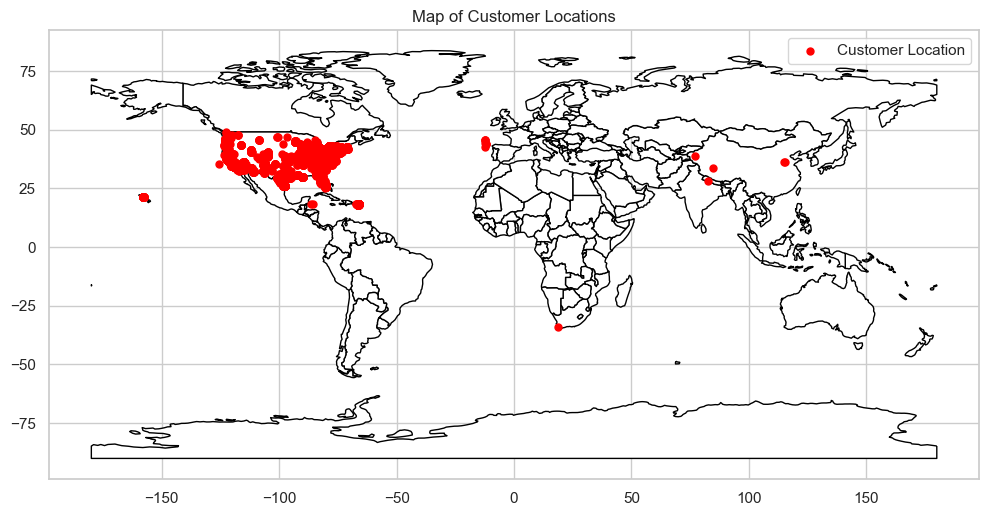

In [156]:
# using the latitude & longitude values to plot the customer location on the world map

# dropping the duplicates rows
df_stores_location_lat_n_long = scm_df[['Latitude', 'Longitude']].drop_duplicates()

df_geo = gpd.GeoDataFrame(
    df_stores_location_lat_n_long,
    geometry=gpd.points_from_xy(df_stores_location_lat_n_long['Longitude'], df_stores_location_lat_n_long['Latitude'])
)

#get the map image
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

#plot the world map
ax = world.plot(figsize=(12, 8), color='white', edgecolor='black')

#plot the store locations as dots
df_geo.plot(ax=ax, marker='o', color='red', markersize=25, label='Customer Location')

plt.title('Map of Customer Locations')
plt.legend(loc='upper right')

Similar to the above figure, it is important for us to understand the order store locations. One major issue for the late deliveries could be because the customer locations are far away from the stores. <br><br>
Therefore, let us try to generate the latitude and longitude values of the Order Location.

In [175]:
# in order to use geopy library, I had to create an account in geonames.org/login and enable free web services.

from geopy import geocoders
geonames = geocoders.GeoNames(username='<<enter username here>>')
geonames.geocode("Bikaner, Rajastán")

Location(Bikaner, Rajasthan, India, (28.01762, 73.31495, 0.0))

In [176]:
geonames.geocode("Bikaner, Rajastán")[1]

(28.01762, 73.31495)

In [185]:
print("Latitude: "),
print(geonames.geocode("Bikaner, Rajastán")[1][0])
print("Longitude: "),
print(geonames.geocode("Bikaner, Rajastán")[1][1])

Latitude: 
28.01762
Longitude: 
73.31495


From the above we can see that we are able to get the correct latitude and longitude values for the city and state input.

In [291]:
# crearted this function to iterate through the data frame, and return a new dataframe contianing the latitude and longitude
from geopy import geocoders
import pandas as pd

def get_latitude_longitude_values(df):
    geoname = geocoders.GeoNames(username='<<enter username here>>')
    new_df = pd.DataFrame(columns=['Order Latitude', 'Order Longitude'])
    for ind, row in df.iterrows():
        new_row = pd.DataFrame({'Order Latitude': geoname.geocode(str(row['Order City'])+", "+str(row['Order State']))[1][0],
                                    'Order Longitude': geoname.geocode(str(row['Order City'])+", "+str(row['Order State']))[1][1]
                                }, 
                                index=[ind]
                               )
        new_df = pd.concat([new_df, new_row], ignore_index=True)
        print("Done with "+str(ind))
        # if(ind == 9):
            #safety break 
            # break
    return new_df

In [292]:
new_df = get_latitude_longitude_values(scm_updated)
new_df.head()

Done with 0
Done with 1
Done with 2
Done with 3
Done with 4
Done with 5
Done with 6
Done with 7
Done with 8
Done with 9
Done with 10
Done with 11
Done with 12
Done with 13
Done with 14
Done with 15
Done with 16
Done with 17
Done with 18
Done with 19
Done with 20
Done with 21
Done with 22
Done with 23
Done with 24


TypeError: 'NoneType' object is not subscriptable

We received an error saying None Type object is not subscriptable. Therefore, in the function we added a print to debug while line in the data frame we are receiving this error. It has come from pandas line 25. Let's see the data in the 25th row of the dataframe:

In [295]:
print(str(scm_updated['Order City'][25])+", "+str(scm_updated['Order State'][25]))

Mandurah, Australia Occidental


In [298]:
print(geonames.geocode("Mandurah, Australia Occidental"))

None


Here the issue is that there is no value returned for 'Mandurah, Australia Occidental'. Let us try to find the latitude and longitude of 'Mandurah, Australia'

In [302]:
print(geonames.geocode("Mandurah, Australia")[1])

(-32.5269, 115.7217)


Now we are getting the values based on 'Australia' instead of 'Australia Occidental'. Therefore, in our pandas data-frame let us change all the occurances of State - 'Australia Occidental' to 'Australia'.

In [308]:
scm_updated.loc[scm_updated['Order State'] =='Australia Occidental', 'Order State']

25        Australia Occidental
26        Australia Occidental
245       Australia Occidental
396       Australia Occidental
397       Australia Occidental
                  ...         
180161    Australia Occidental
180196    Australia Occidental
180273    Australia Occidental
180333    Australia Occidental
180377    Australia Occidental
Name: Order State, Length: 917, dtype: object

In [309]:
scm_updated.loc[scm_updated['Order State'] =='Australia Occidental', 'Order State'] = 'Australia'

In [310]:
scm_updated.loc[scm_updated['Order State'] =='Australia Occidental', 'Order State']

Series([], Name: Order State, dtype: object)

In [311]:
# now let us try to run it again
new_df = get_latitude_longitude_values(scm_updated)
pd.set_option('display.max_rows', 10)
new_df.head(-10)

Done with 0
Done with 1
Done with 2
Done with 3
Done with 4
Done with 5
Done with 6
Done with 7
Done with 8
Done with 9
Done with 10
Done with 11
Done with 12
Done with 13
Done with 14
Done with 15
Done with 16
Done with 17
Done with 18
Done with 19
Done with 20
Done with 21
Done with 22
Done with 23
Done with 24
Done with 25
Done with 26
Done with 27
Done with 28
Done with 29
Done with 30
Done with 31
Done with 32
Done with 33
Done with 34
Done with 35
Done with 36


TypeError: 'NoneType' object is not subscriptable

In [312]:
print(str(scm_updated['Order City'][37])+", "+str(scm_updated['Order State'][37]))

Wollongong, Nueva Gales del Sur


'Nueva Gales del Sur' is New South Wales' in another language. Similarly let us change it from 'Nueva Gales del Sur' to 'New South Wales'

In [313]:
print(geonames.geocode("Wollongong, New South Wales")[1])

(-34.424, 150.89345)


In [314]:
scm_updated.loc[scm_updated['Order State'] =='Nueva Gales del Sur', 'Order State'] = 'New South Wales'

In [315]:
# now let us try to run it again
new_df = get_latitude_longitude_values(scm_updated)
pd.set_option('display.max_rows', 10)
new_df.head(-10)

Done with 0
Done with 1
Done with 2
Done with 3
Done with 4
Done with 5
Done with 6
Done with 7
Done with 8
Done with 9
Done with 10
Done with 11
Done with 12
Done with 13
Done with 14
Done with 15
Done with 16
Done with 17
Done with 18
Done with 19
Done with 20
Done with 21
Done with 22
Done with 23
Done with 24
Done with 25
Done with 26
Done with 27
Done with 28
Done with 29
Done with 30
Done with 31
Done with 32
Done with 33
Done with 34
Done with 35
Done with 36
Done with 37
Done with 38
Done with 39
Done with 40
Done with 41
Done with 42
Done with 43
Done with 44
Done with 45
Done with 46
Done with 47
Done with 48
Done with 49


TypeError: 'NoneType' object is not subscriptable

In [316]:
print(str(scm_updated['Order City'][50])+", "+str(scm_updated['Order State'][50]))

Murray Bridge, Australia del Sur


In [317]:
print(geonames.geocode("Murray Bridge, Australia")[1])

(-35.11986, 139.27345)


In [318]:
scm_updated.loc[scm_updated['Order State'] =='Australia del Sur', 'Order State'] = 'Australia'

In [319]:
# now let us try to run it again
new_df = get_latitude_longitude_values(scm_updated)
pd.set_option('display.max_rows', 10)
new_df.head(-10)

Done with 0
Done with 1
Done with 2
Done with 3
Done with 4
Done with 5
Done with 6
Done with 7
Done with 8
Done with 9
Done with 10
Done with 11
Done with 12
Done with 13
Done with 14
Done with 15
Done with 16
Done with 17
Done with 18
Done with 19
Done with 20
Done with 21
Done with 22
Done with 23
Done with 24
Done with 25
Done with 26
Done with 27
Done with 28
Done with 29
Done with 30
Done with 31
Done with 32
Done with 33
Done with 34
Done with 35
Done with 36
Done with 37
Done with 38
Done with 39
Done with 40
Done with 41
Done with 42
Done with 43
Done with 44
Done with 45
Done with 46
Done with 47
Done with 48
Done with 49
Done with 50
Done with 51
Done with 52
Done with 53
Done with 54
Done with 55
Done with 56
Done with 57
Done with 58
Done with 59
Done with 60
Done with 61
Done with 62
Done with 63
Done with 64
Done with 65
Done with 66
Done with 67
Done with 68


TypeError: 'NoneType' object is not subscriptable

In [320]:
print(str(scm_updated['Order City'][69])+", "+str(scm_updated['Order State'][69]))

Hayange, Alsacia-Champaña-Ardenas-Lorena


The above is a place in France. But since we can see that it is able to recognize the latitude and longitude without the state. Therefore, let us try to find the latitude and longitude of only the cities.

In [321]:
print(geonames.geocode("Hayange")[1])

(49.32881, 6.06278)


In [325]:
# re-writing the function 
def get_latitude_longitude_values(df):
    geoname = geocoders.GeoNames(username='<<enter username here>>')
    new_df = pd.DataFrame(columns=['Order Latitude', 'Order Longitude'])
    for ind, row in df.iterrows():
        new_row = pd.DataFrame({'Order Latitude': geoname.geocode(str(row['Order City']))[1][0],
                                    'Order Longitude': geoname.geocode(str(row['Order City']))[1][1]
                                }, 
                                index=[ind]
                               )
        new_df = pd.concat([new_df, new_row], ignore_index=True)
        print(str(ind))
        # if(ind == 9):
            #safety break 
            # break
    return new_df

In [326]:
# now let us try to run it again
new_df = get_latitude_longitude_values(scm_updated)
# new_df.head(-10)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

GeocoderQuotaExceeded: the hourly limit of 1000 credits for rkaushick has been exceeded. Please throttle your requests or use the commercial service.

Based on the above error it looks like we do not have enough credits in the free account to generaete the latitude and longitude values of all the cities. After calculating more than 1,280 latitude and longitude values, I encountered the problem. <br> <br>
Hence, I will abandon this feature extraction of the Order store latitude and longitude values as out of scope for the this final project.

In [328]:
# Therefore let us use Binary Encoders for encoding the Order City & Country.
scm_updated[['Order City', 'Order Country', 'Customer City', 'Customer Country']].head(-10)

,Order City,Order Country,Customer City,Customer Country
0,Bekasi,Indonesia,Caguas,Puerto Rico
1,Bikaner,India,Caguas,Puerto Rico
2,Bikaner,India,San Jose,EE. UU.
3,Townsville,Australia,Los Angeles,EE. UU.
4,Townsville,Australia,Caguas,Puerto Rico
...,...,...,...,...
180504,Canberra,Australia,Caguas,Puerto Rico
180505,Qingdao,China,Highland,EE. UU.
180506,Sanya,China,San Antonio,EE. UU.
180507,Hanoi,Vietnam,Philadelphia,EE. UU.


In [334]:
# binary encoding of order city & customer city
binary_encoder_city = ce.BinaryEncoder(cols=['Order City', 'Customer City'], return_df=True)
city_binary_encoded_data = binary_encoder_city.fit_transform(scm_updated[['Order City', 'Customer City']])
city_binary_encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180516 entries, 0 to 180518
Data columns (total 22 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   Order City_0     180516 non-null  int64
 1   Order City_1     180516 non-null  int64
 2   Order City_2     180516 non-null  int64
 3   Order City_3     180516 non-null  int64
 4   Order City_4     180516 non-null  int64
 5   Order City_5     180516 non-null  int64
 6   Order City_6     180516 non-null  int64
 7   Order City_7     180516 non-null  int64
 8   Order City_8     180516 non-null  int64
 9   Order City_9     180516 non-null  int64
 10  Order City_10    180516 non-null  int64
 11  Order City_11    180516 non-null  int64
 12  Customer City_0  180516 non-null  int64
 13  Customer City_1  180516 non-null  int64
 14  Customer City_2  180516 non-null  int64
 15  Customer City_3  180516 non-null  int64
 16  Customer City_4  180516 non-null  int64
 17  Customer City_5  180516 non-null  

In [335]:
# binary encoding of order country
binary_encoder_country = ce.BinaryEncoder(cols=['Order Country', 'Customer Country'], return_df=True)
country_binary_encoded_data = binary_encoder_country.fit_transform(scm_updated[['Order Country', 'Customer Country']])
country_binary_encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180516 entries, 0 to 180518
Data columns (total 10 columns):
 #   Column              Non-Null Count   Dtype
---  ------              --------------   -----
 0   Order Country_0     180516 non-null  int64
 1   Order Country_1     180516 non-null  int64
 2   Order Country_2     180516 non-null  int64
 3   Order Country_3     180516 non-null  int64
 4   Order Country_4     180516 non-null  int64
 5   Order Country_5     180516 non-null  int64
 6   Order Country_6     180516 non-null  int64
 7   Order Country_7     180516 non-null  int64
 8   Customer Country_0  180516 non-null  int64
 9   Customer Country_1  180516 non-null  int64
dtypes: int64(10)
memory usage: 15.1 MB


In [336]:
# interesting how customer country only has 2 values
scm_updated['Customer Country'].value_counts()

Customer Country
EE. UU.        111143
Puerto Rico     69373
Name: count, dtype: int64

In [337]:
# Now setting these values in the data frame
scm_updated[['Order City 0', 'Order City 1', 'Order City 2', 'Order City 3', 
             'Order City 4', 'Order City 5', 'Order City 6', 'Order City 7', 
             'Order City 8', 'Order City 9', 'Order City 11', 'Order City 12',
             'Customer City 0', 'Customer City 1', 'Customer City 2', 'Customer City 3', 'Customer City 4',
             'Customer City 5', 'Customer City 6', 'Customer City 7', 'Customer City 8', 'Customer City 9']] = city_binary_encoded_data

scm_updated[['Order Country 0', 'Order Country 1', 
             'Order Country 2', 'Order Country 3', 
             'Order Country 4', 'Order Country 5', 
             'Order Country 6', 'Order Country 7',
             'Customer Country 0', 'Customer Country 1']]  = country_binary_encoded_data

In [339]:
scm_updated[['Order City',
             'Order City 0', 'Order City 1', 'Order City 2', 'Order City 3', 
             'Order City 4', 'Order City 5', 'Order City 6', 'Order City 7', 
             'Order City 8', 'Order City 9', 'Order City 11', 'Order City 12'
             ]].head()

,Order City,Order City 0,Order City 1,Order City 2,Order City 3,Order City 4,Order City 5,Order City 6,Order City 7,Order City 8,Order City 9,Order City 11,Order City 12
0,Bekasi,0,0,0,0,0,0,0,0,0,0,0,1
1,Bikaner,0,0,0,0,0,0,0,0,0,0,1,0
2,Bikaner,0,0,0,0,0,0,0,0,0,0,1,0
3,Townsville,0,0,0,0,0,0,0,0,0,0,1,1
4,Townsville,0,0,0,0,0,0,0,0,0,0,1,1


Now that we have done the binary encoding of the order city, order country, customer city & customer country, we can drop all the address related columns present in the dataframe.

In [340]:
scm_updated.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180516 entries, 0 to 180518
Data columns (total 100 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180516 non-null  int64  
 1   Days for shipment (scheduled)  180516 non-null  int64  
 2   Benefit per order              180516 non-null  float64
 3   Sales per customer             180516 non-null  float64
 4   Late_delivery_risk             180516 non-null  int64  
 5   Customer City                  180516 non-null  object 
 6   Customer Country               180516 non-null  object 
 7   Customer State                 180516 non-null  object 
 8   Customer Street                180516 non-null  object 
 9   Customer Zipcode               180516 non-null  float64
 10  Latitude                       180516 non-null  float64
 11  Longitude                      180516 non-null  float64
 12  Order City                     180

### Address Columns to drop:
- Customer City
- Customer Country
- Customer State
- Customer Street
- Customer Zipcode
- Order City
- Order Country
- Order Region
- Order State


In [341]:
scm_updated.drop(columns=['Customer City', 'Customer Country', 'Customer State', 'Customer Street', 'Customer Zipcode', 
                          'Order City', 'Order Country', 'Order Region', 'Order State'], inplace=True)

In [342]:
scm_updated.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180516 entries, 0 to 180518
Data columns (total 91 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180516 non-null  int64  
 1   Days for shipment (scheduled)  180516 non-null  int64  
 2   Benefit per order              180516 non-null  float64
 3   Sales per customer             180516 non-null  float64
 4   Late_delivery_risk             180516 non-null  int64  
 5   Latitude                       180516 non-null  float64
 6   Longitude                      180516 non-null  float64
 7   Order Item Discount            180516 non-null  float64
 8   Order Item Discount Rate       180516 non-null  float64
 9   Order Item Product Price       180516 non-null  float64
 10  Order Item Profit Ratio        180516 non-null  float64
 11  Order Item Quantity            180516 non-null  int64  
 12  Sales                          1805

With this we have preprocessed all the columns into the required format for the machine learning model. Now we do not have any column with null values and we have also successfully converted all the text columns into relevant numeric values. So we can now train the models and see the results

## Split Train & Test Data

In [343]:
from sklearn.model_selection import train_test_split

X_train_v2, X_test_v2, y_train_v2, y_test_v2 = train_test_split(scm_updated.drop(columns=['Late_delivery_risk']), scm_updated['Late_delivery_risk'], random_state=23)
# by default setting the train size to be 25 %

# Decision Tree Model #3

In [344]:
tree_clf_3 = DecisionTreeClassifier(max_depth=5, max_features="sqrt", random_state=23, splitter="random")
tree_clf_3.fit(X_train_v2, y_train_v2)

DecisionTreeClassifier(max_depth=5, max_features='sqrt', random_state=23,
                       splitter='random')

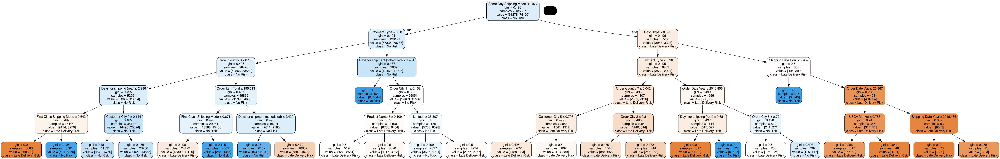

In [353]:
# plotting the decision tree

dot_data = StringIO()
export_graphviz(
        tree_clf_3,
        out_file=dot_data,
        feature_names= X_train_v2.columns.values.tolist(),
        class_names= ["Late Delivery Risk", "No Risk"],
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('decision_tree_model_3.png')
Image(graph.create_png())

In [346]:
# Let us see how well the training does:
tree_clf_3.score(X_train_v2, y_train_v2)

0.6596128136379416

In [347]:
tree_clf_3.score(X_test_v2, y_test_v2)

0.6607724523033969

# Random Forest Classifier #1

In [348]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=23,
                                    n_jobs=-1,
                                    max_depth=5,
                                    n_estimators=100,
                                    oob_score=True)

In [350]:
%%time
rf_clf.fit(X_train_v2, y_train_v2)

CPU times: user 25min 27s, sys: 8.24 s, total: 25min 36s
Wall time: 3min 49s


RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=23)

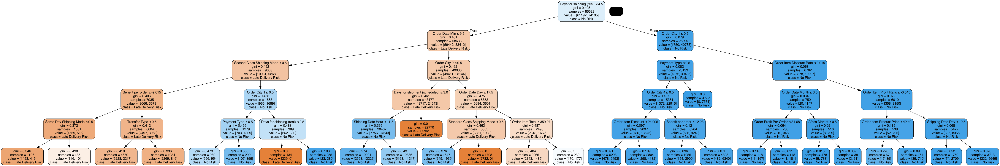

In [402]:
# plotting the random forest's 1st tree

dot_data = StringIO()
export_graphviz(
        rf_clf.estimators_[0],
        out_file=dot_data,
        feature_names= X_train_v2.columns.values.tolist(),
        class_names= ["Late Delivery Risk", "No Risk"],
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('random_forest_model_1.png')
Image(graph.create_png())

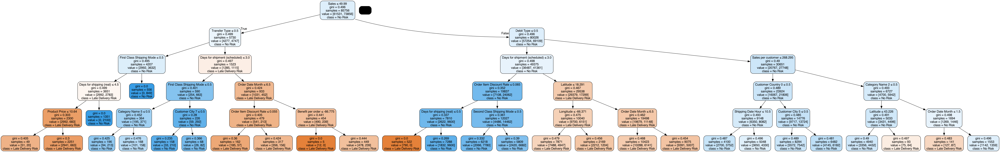

In [403]:
# plotting the random forest's 2nd tree

dot_data = StringIO()
export_graphviz(
        rf_clf.estimators_[1],
        out_file=dot_data,
        feature_names= X_train_v2.columns.values.tolist(),
        class_names= ["Late Delivery Risk", "No Risk"],
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('random_forest_model_1_2nd_estimater.png')
Image(graph.create_png())

In [351]:
# checking the training accuracy
rf_clf.score(X_train_v2, y_train_v2)

0.9359982863938192

For the random forest model, we can see that the training acuracy is 93.60%. Let us look at the accuracy of the test set.

In [352]:
# checking the test accuracy
rf_clf.score(X_test_v2, y_test_v2)

0.9358284030224467

The test accuracy is very close at 93.58%.

# Feature Importance

In [364]:
pd.set_option('display.max_rows', None)
important_features_rf_clf = pd.DataFrame({
    "Column": X_train_v2.columns,
    "Importance Score": rf_clf.feature_importances_
})
important_features_rf_clf.sort_values(by='Importance Score', ascending=False)

,Column,Importance Score
0,Days for shipping (real),0.346944
1,Days for shipment (scheduled),0.216117
30,Standard Class Shipping Mode,0.202429
27,First Class Shipping Mode,0.120478
29,Second Class Shipping Mode,0.045490
56,Shipping Date Hour,0.017773
28,Same Day Shipping Mode,0.016205
51,Order Date Hour,0.015866
18,Transfer Type,0.007911
55,Shipping Date Day,0.001983


# Random Forest Classifier #2 (On 15 Most Important Features)

Let us consider the top 15 features and train another Random Forest model on only these features.

In [367]:
scm_15 = scm_updated[['Days for shipping (real)', 
                      'Days for shipment (scheduled)', 
                      'Standard Class Shipping Mode', 
                      'First Class Shipping Mode', 
                      'Second Class Shipping Mode', 
                      'Shipping Date Hour',
                      'Same Day Shipping Mode',
                      'Order Date Hour',
                      'Transfer Type',
                      'Shipping Date Day',
                      'Order Date Day',
                      'Debit Type',
                      'Payment Type',
                      'Latitude',
                      'Longitude',
                      'Late_delivery_risk']]
scm_15.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180516 entries, 0 to 180518
Data columns (total 16 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Days for shipping (real)       180516 non-null  int64  
 1   Days for shipment (scheduled)  180516 non-null  int64  
 2   Standard Class Shipping Mode   180516 non-null  float64
 3   First Class Shipping Mode      180516 non-null  float64
 4   Second Class Shipping Mode     180516 non-null  float64
 5   Shipping Date Hour             180516 non-null  int32  
 6   Same Day Shipping Mode         180516 non-null  float64
 7   Order Date Hour                180516 non-null  int32  
 8   Transfer Type                  180516 non-null  float64
 9   Shipping Date Day              180516 non-null  int32  
 10  Order Date Day                 180516 non-null  int32  
 11  Debit Type                     180516 non-null  float64
 12  Payment Type                   1805

In [368]:
# now again splitting this dataset into train and test
X_15_train, X_15_test, y_15_train, y_15_test = train_test_split(scm_15.drop(columns=['Late_delivery_risk']), scm_15['Late_delivery_risk'], random_state=23)

In [369]:
rf_clf_2 = RandomForestClassifier(random_state=23,
                                    n_jobs=-1,
                                    max_depth=5,
                                    n_estimators=100,
                                    oob_score=True)

In [370]:
rf_clf_2.fit(X_15_train, y_15_train)

RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=23)

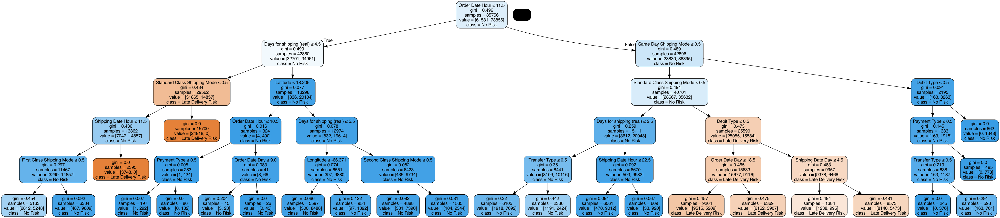

In [405]:
# plotting the 2nd random forest model (1st estimator)

dot_data = StringIO()
export_graphviz(
        rf_clf_2.estimators_[1],
        out_file=dot_data,
        feature_names= X_15_train.columns.values.tolist(),
        class_names= ["Late Delivery Risk", "No Risk"],
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('random_forest_model_2.png')
Image(graph.create_png())

In [372]:
rf_clf_2.score(X_15_train, y_15_train)

0.9754038423186865

In [373]:
rf_clf_2.score(X_15_test, y_15_test)

0.975780540229121

# Hyper Parameter Tuning
## Randomized Search CV

In [374]:
rf_clf_2.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': True,
 'random_state': 23,
 'verbose': 0,
 'warm_start': False}

In [378]:
# Creating the random grid as a dict
random_grid = {'n_estimators': [25, 50, 100, 200, 400],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [3, 5, 10, 15, 20],
               'min_samples_split': [2, 3, 5],
               'min_samples_leaf': [1, 2],
               'bootstrap': [True, False]}

In [379]:
from sklearn.model_selection import RandomizedSearchCV

rf_random_search_cv = RandomizedSearchCV(estimator=rf_clf_2, 
                                         param_distributions=random_grid,
                                         n_iter=25,
                                         cv=2,
                                         verbose=2,
                                         random_state=23,
                                         n_jobs=-1)

In [380]:
%%time
rf_random_search_cv.fit(X_15_train, y_15_train)

Fitting 2 folds for each of 25 candidates, totalling 50 fits


112362.07s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.07s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.08s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.09s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.10s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.11s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.14s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
112362.15s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   0.0s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time=   0.1s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END bootstrap=False, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   0.0s
[CV] END bootstrap=False, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   0.0s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time= 1.1min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time= 1.2min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time= 1.2min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time= 1.2min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=  40.6s
[CV] END bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=25; total time=  41.8s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.0s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, n_estimators=50; total time=   0.0s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 4.0min
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.0s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=25; total time=   0.2s
[CV] END bootstrap=False, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=25; total time=   0.1s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 4.0min
[CV] END bootstrap=True, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  53.9s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time=   0.1s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time=   0.1s
[CV] END bootstrap=True, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  56.4s
[CV] END bootstrap=True, max_depth=20, max_feature

/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=50; total time=   0.2s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.0s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=200; total time=   0.2s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  54.9s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time= 6.2min
[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time= 6.2min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time= 5.8min
[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time= 5.8min
[CV] END bootstrap=False, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END bootstrap=False, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.1s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=

[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25; total time=   0.1s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=2, min_samples_split=3, n_estimators=25; total time=   0.1s


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time= 1.6min
[CV] END bootstrap=True, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, n_estimators=100; total time= 1.6min
[CV] END bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time= 5.9min
[CV] END bootstrap=True, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time= 5.9min
[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time= 2.5min
[CV] END bootstrap=True, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=400; total time= 2.5min


/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


28 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
28 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 437, in fit
    raise ValueError("Out of bag estimation only available if bootstrap=True")
ValueError: Out of bag estimation only available if bootstrap=T

CPU times: user 3min 8s, sys: 1.2 s, total: 3min 9s
Wall time: 9min 11s


RandomizedSearchCV(cv=2,
                   estimator=RandomForestClassifier(max_depth=5, n_jobs=-1,
                                                    oob_score=True,
                                                    random_state=23),
                   n_iter=25, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 5, 10, 15, 20],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 3, 5],
                                        'n_estimators': [25, 50, 100, 200,
                                                         400]},
                   random_state=23, verbose=2)

In [381]:
# Let us see the best parameters
rf_random_search_cv.best_params_

{'n_estimators': 50,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}

# Random Forest Classifier #3 (RF + Randomized Search CV) 

In [382]:
rf_clf_3 = RandomForestClassifier(random_state=23,
                                    n_jobs=-1,
                                    max_depth=10,
                                    n_estimators=50,
                                    min_samples_split=5,
                                    min_samples_leaf=2,
                                    max_features='auto',
                                    bootstrap=True,
                                    oob_score=True)

In [383]:
rf_clf_3.fit(X_15_train, y_15_train)

/opt/homebrew/anaconda3/envs/info6105/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:427: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



RandomForestClassifier(max_depth=10, max_features='auto', min_samples_leaf=2,
                       min_samples_split=5, n_estimators=50, n_jobs=-1,
                       oob_score=True, random_state=23)

In [406]:
# plotting the 3rd random forest model (1st estimator)

dot_data = StringIO()
export_graphviz(
        rf_clf_3.estimators_[1],
        out_file=dot_data,
        feature_names= X_15_train.columns.values.tolist(),
        class_names= ["Late Delivery Risk", "No Risk"],
        rounded=True,
        filled=True,
        special_characters=True
    )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('random_forest_model_3.png')
Image(graph.create_png())

In [384]:
rf_clf_3.score(X_15_train, y_15_train)

0.9755146358217555

In [385]:
rf_clf_3.score(X_15_test, y_15_test)

0.9758470163309624

# Results
- Decision Tree #1 with 5 levels (mid-term project)
    - Training Accuracy: 46.40 %
    - Testing Accuracy: Decided Not to Test.
- Decision Tree #2 with 10 levels (mid-term project)
    - Training Accuracy: 51.82 %
    - Testing Accuracy: 51.86 %
- Decision Tree #3 with extensively preprocessed data (final project)
    - Training Accuracy: 65.96 %
    - Testing Accuracy: 66.08 %
- Random Forest #1 with extensively preprocessed data (final project)
    - Training Accuracy: 93.60 %
    - Testing Accuracy: 93.58 %
- Random Forest #2 with 15 most important features (final project)
    - Training Accuracy: 97.54 %
    - Testing Accuracy: 97.58 %
- Random Forest #3 with Randomized Search CV (final project)
    - Training Accuracy: 97.55 %
    - Testing Accuracy: 97.58 %